In [3]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
import re
from tqdm import tqdm
import pandas as pd
from vis.vis import plot_mask
from utils.tools import *
import scipy.io as scio
import PIL.Image as Image

In [4]:
n = 10
label = 0

vis all images

In [5]:
data_root_fp = '../DATA/22_oct_Coronary_Artery_CT/'

In [6]:
mask_root = os.path.join(data_root_fp, '2D_DATA/2D_DATA_BULID_2/MASK/{}/out/'.format(n))
mat_root = os.path.join(data_root_fp, '2D_DATA/2D_DATA_BULID_2/IMAGE/{}/out/'.format(n))
two_d_vis_root = os.path.join(data_root_fp, '2D_DATA/2D_DATA_BULID_2/IMAGE/{}/all_branchs/'.format(n))

if os.path.exists(two_d_vis_root) == False:
    os.makedirs(two_d_vis_root)


mask_fp_list = os.listdir(mask_root)
mat_fp_list = os.listdir(mat_root)

mask_fp_list = sorted(mask_fp_list, key=lambda x: int(re.findall('\d+', x)[-1]))
mask_fp_list = sorted(mask_fp_list, key=lambda x: int(re.findall('\d+', x)[1]))

mat_fp_list = sorted(mat_fp_list, key=lambda x: int(re.findall('\d+', x)[-1]))
mat_fp_list = sorted(mat_fp_list, key=lambda x: int(re.findall('\d+', x)[1]))

print(mat_fp_list)
print(mask_fp_list)

FileNotFoundError: [WinError 3] 系统找不到指定的路径。: '../DATA/22_oct_Coronary_Artery_CT/2D_DATA/2D_DATA_BULID_2/MASK/10/out/'

In [23]:
branchs = np.unique([re.findall('\d+', x)[1] for x in mat_fp_list])
branchs

array(['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18',
       '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28',
       '29', '3', '30', '31', '32', '33', '34', '35', '36', '37', '4',
       '5', '6', '7', '8', '9'], dtype='<U2')

In [13]:
# assert len(mask_fp_list) == len(mat_fp_list)

0
shape mean is 53.0
shape max is 53
shape min is 53


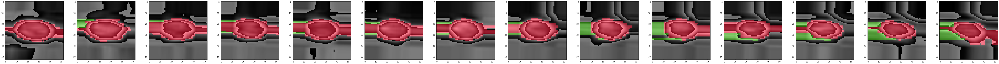

1
shape mean is 53.0
shape max is 53
shape min is 53


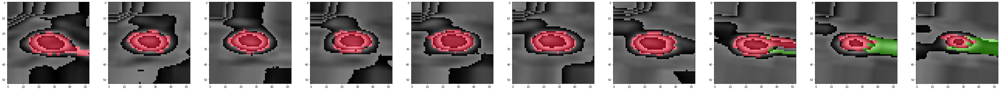

10
shape mean is 53.0
shape max is 53
shape min is 53


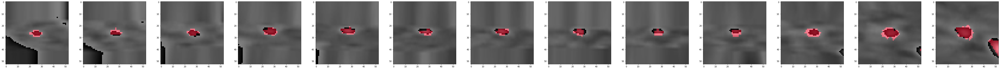

11
shape mean is 53.0
shape max is 53
shape min is 53


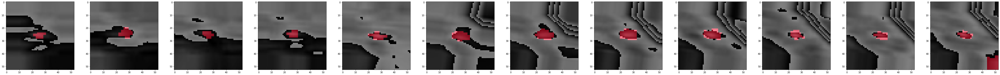

12
shape mean is 53.0
shape max is 53
shape min is 53


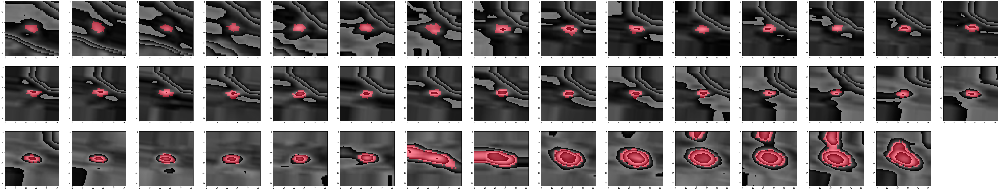

13
shape mean is 53.0
shape max is 53
shape min is 53


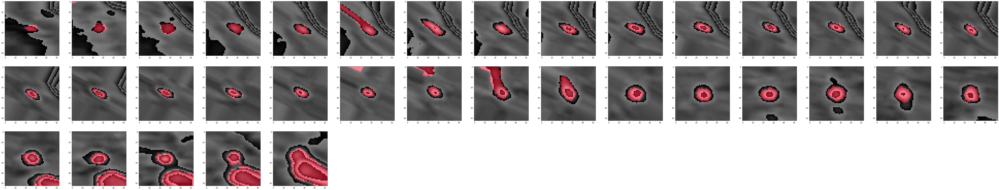

14
shape mean is 53.0
shape max is 53
shape min is 53


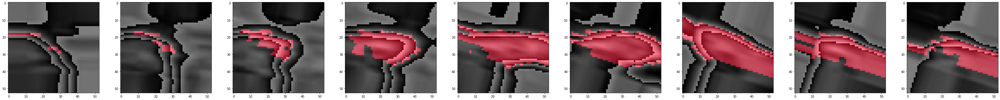

15
shape mean is 53.0
shape max is 53
shape min is 53


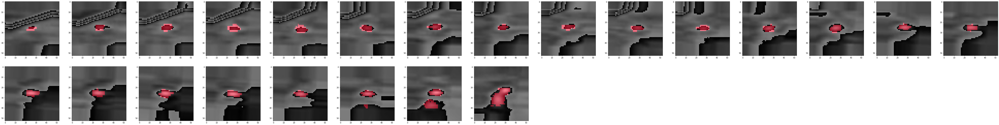

16
shape mean is 53.0
shape max is 53
shape min is 53


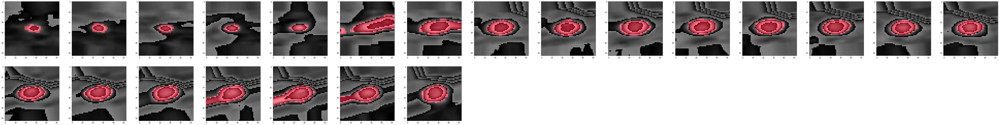

17
shape mean is 53.0
shape max is 53
shape min is 53


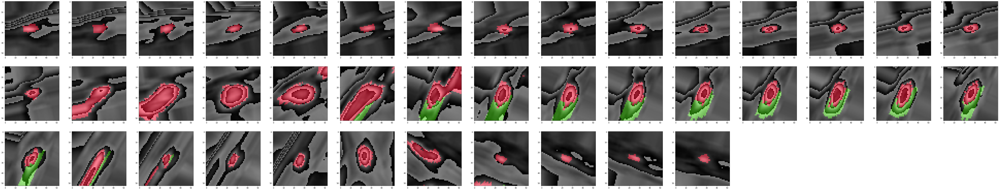

18
shape mean is 53.0
shape max is 53
shape min is 53


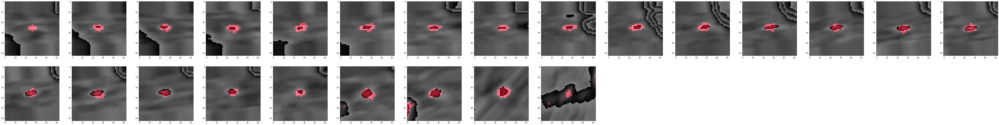

19
shape mean is 53.0
shape max is 53
shape min is 53


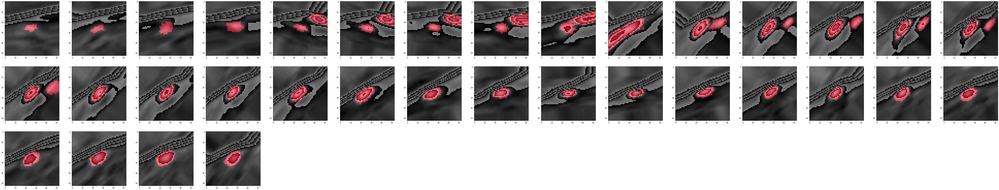

2
shape mean is 53.0
shape max is 53
shape min is 53


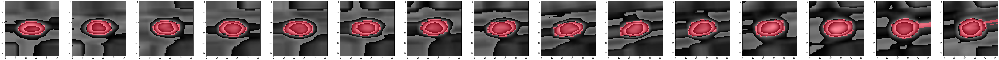

20
shape mean is 53.0
shape max is 53
shape min is 53


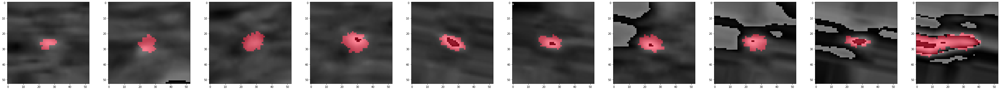

21
shape mean is 53.0
shape max is 53
shape min is 53


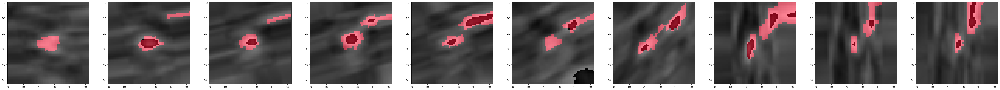

22
shape mean is 53.0
shape max is 53
shape min is 53


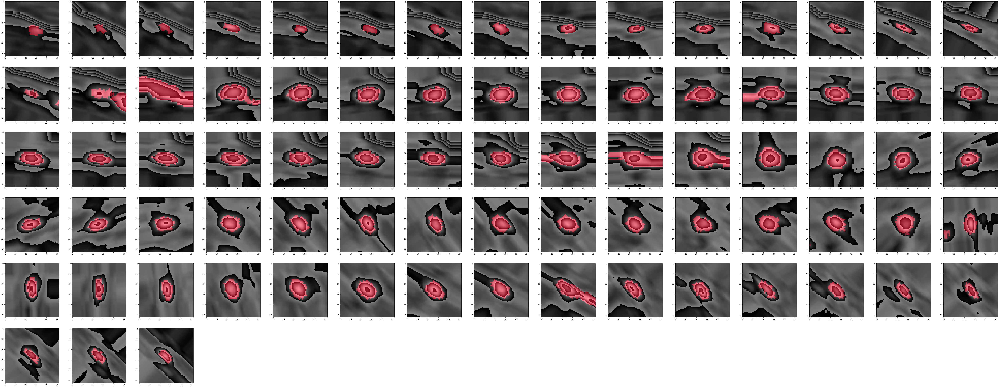

23
shape mean is 53.0
shape max is 53
shape min is 53


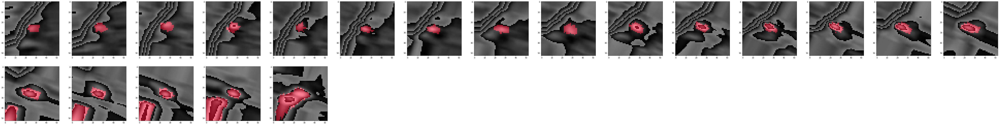

24
shape mean is 53.0
shape max is 53
shape min is 53


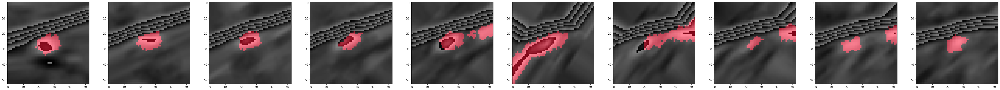

25
shape mean is 53.0
shape max is 53
shape min is 53


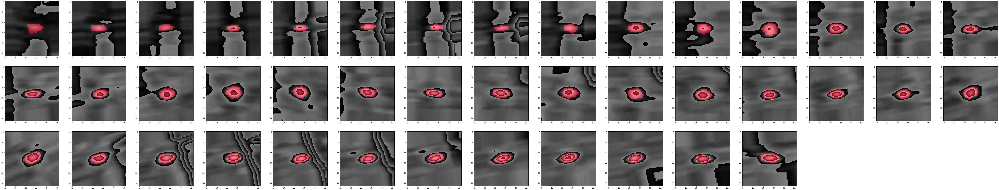

26
shape mean is 53.0
shape max is 53
shape min is 53


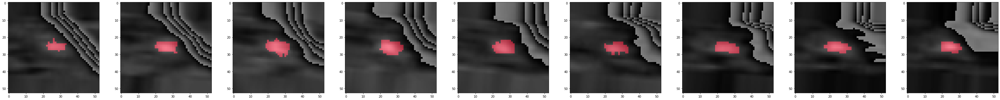

27
shape mean is 53.0
shape max is 53
shape min is 53


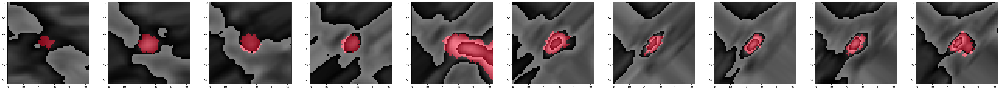

28
shape mean is 53.0
shape max is 53
shape min is 53


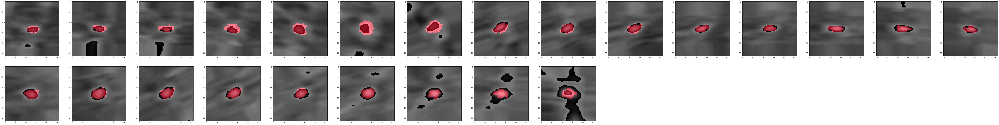

29
shape mean is 53.0
shape max is 53
shape min is 53


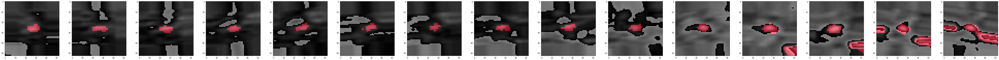

3
shape mean is 53.0
shape max is 53
shape min is 53


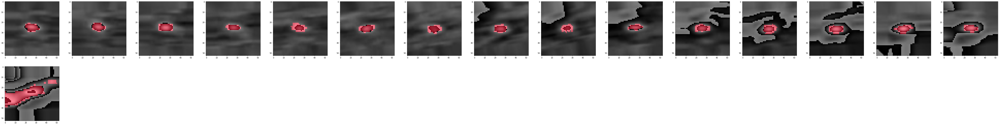

30
shape mean is 53.0
shape max is 53
shape min is 53


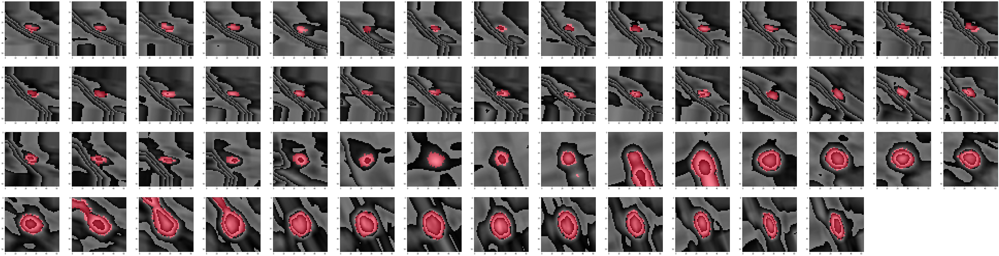

31
shape mean is 53.0
shape max is 53
shape min is 53


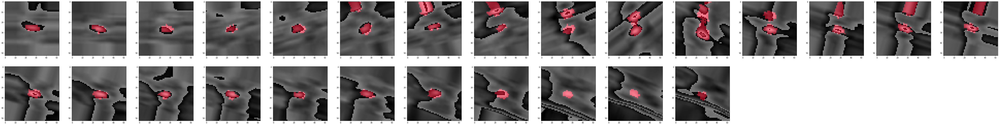

32
shape mean is 53.0
shape max is 53
shape min is 53


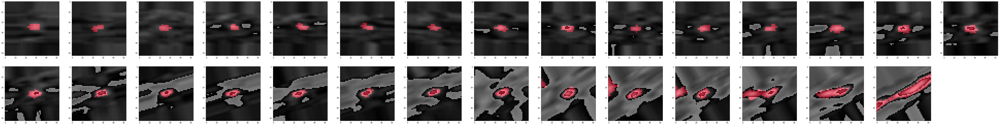

33
shape mean is 53.0
shape max is 53
shape min is 53


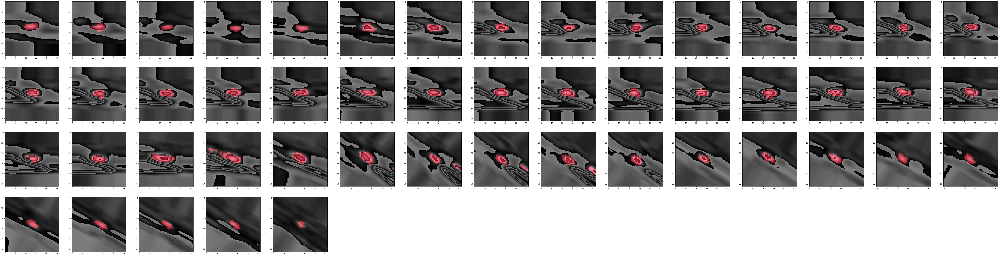

34
shape mean is 53.0
shape max is 53
shape min is 53


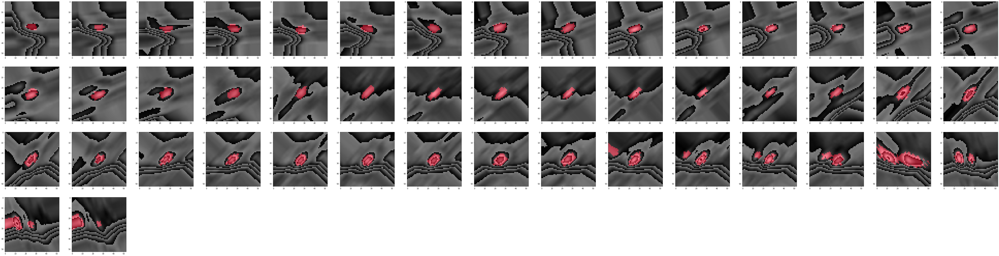

35
shape mean is 53.0
shape max is 53
shape min is 53


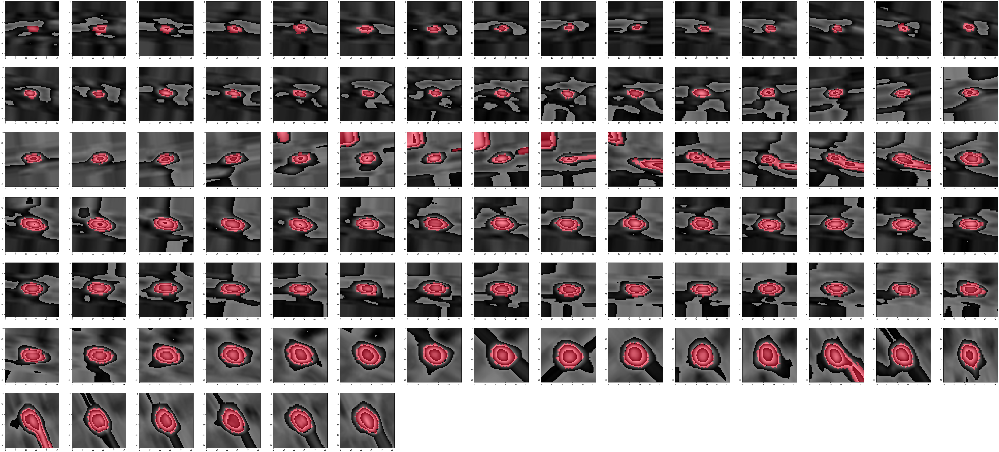

36
shape mean is 53.0
shape max is 53
shape min is 53


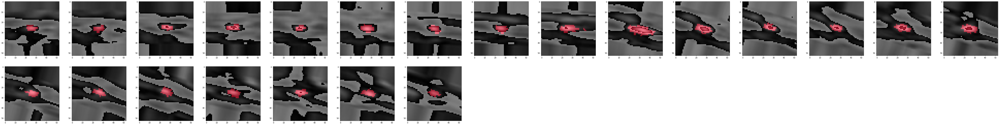

37
shape mean is 53.0
shape max is 53
shape min is 53


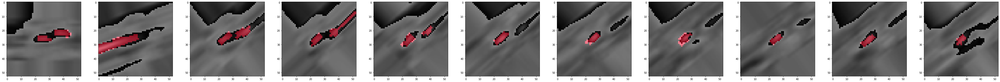

4
shape mean is 53.0
shape max is 53
shape min is 53


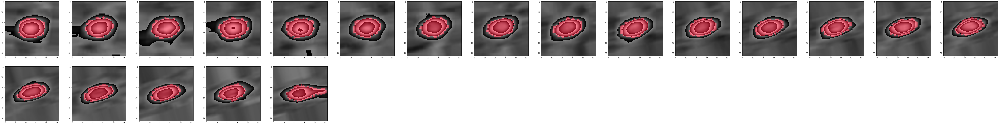

5
shape mean is 53.0
shape max is 53
shape min is 53


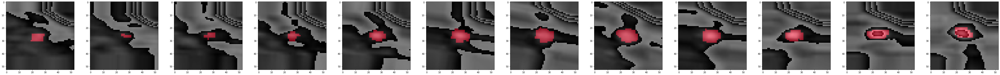

6
shape mean is 53.0
shape max is 53
shape min is 53


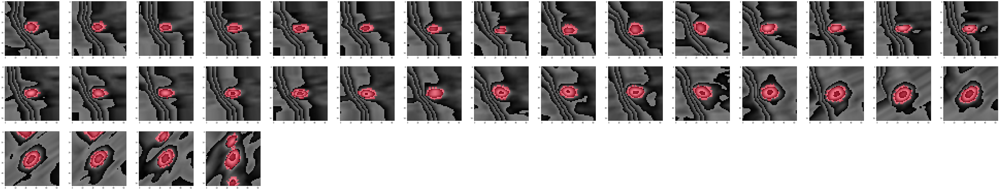

7
shape mean is 53.0
shape max is 53
shape min is 53


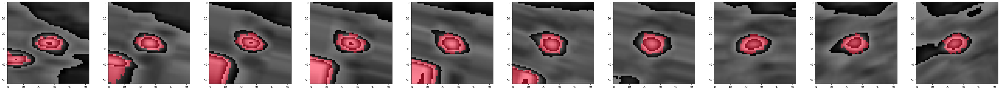

8
shape mean is 53.0
shape max is 53
shape min is 53


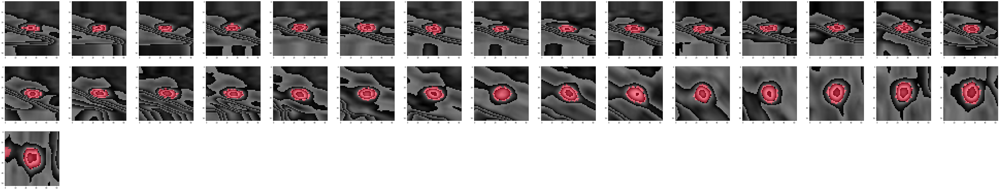

9
shape mean is 53.0
shape max is 53
shape min is 53


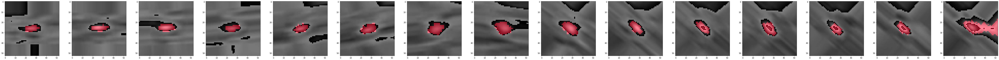

In [24]:
for b in branchs:
    print(b)
    plt.figure(figsize=[100, 100])
    j = 0

    shape_list=[]
    for i in range(len(mat_fp_list)):

        if re.findall('\d+', mat_fp_list[i])[1] == b:

            mat = scio.loadmat(os.path.join(mat_root, mat_fp_list[i]))
            img = mat["RV"]
            img = img.astype(np.uint8)
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
            # print(img.shape)

            try:
                mask = scio.loadmat(os.path.join(mask_root, mask_fp_list[i]))
                mask = mask["RV_mask"]
                mask = mask.astype(np.uint8)
                mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
                mask_1 = np.where(mask == [1, 1, 1],  [255, 10, 45], 0)
                mask_254 = np.where(mask == [254, 254, 254], [55, 200, 5], 0)
                mask = mask_1 + mask_254
            except:
                mask = np.zeros(img.shape)


            mask = mask.astype(np.uint8)

            img_add = cv2.addWeighted(img, 0.5, mask, 0.5, gamma=0.0)
            shape_list.append(img_add.shape[0])

            plt.subplot(15, 15, j+1)
            plt.imshow(img_add)

            j = j+1
    print("shape mean is {}".format(np.mean(shape_list)))
    print("shape max is {}".format(np.max(shape_list)))
    print("shape min is {}".format(np.min(shape_list)))

    # 保存着色图
    colored_vis_root = os.path.join(two_d_vis_root, 'with_color')
    if os.path.exists(colored_vis_root) == False:
        os.makedirs(colored_vis_root)

    plt.savefig(os.path.join(colored_vis_root, 'nii_{}_branch_{}_with_color.png'.format(n, b)))
    plt.show()

0
shape mean is 53.0
shape max is 53
shape min is 53


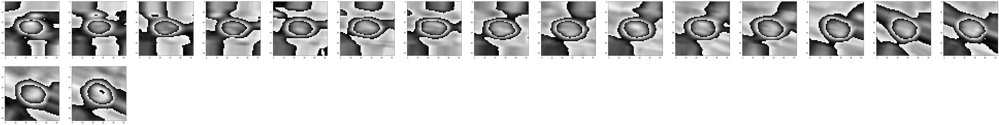

1
shape mean is 53.0
shape max is 53
shape min is 53


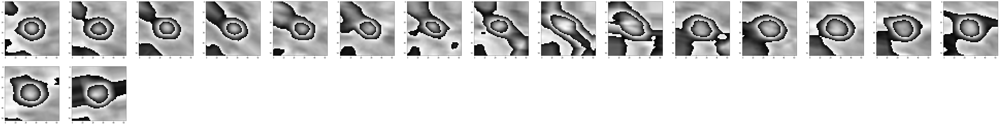

10
shape mean is 53.0
shape max is 53
shape min is 53


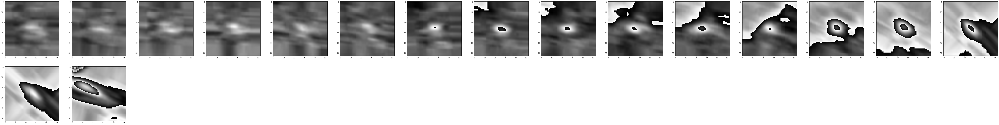

11
shape mean is 53.0
shape max is 53
shape min is 53


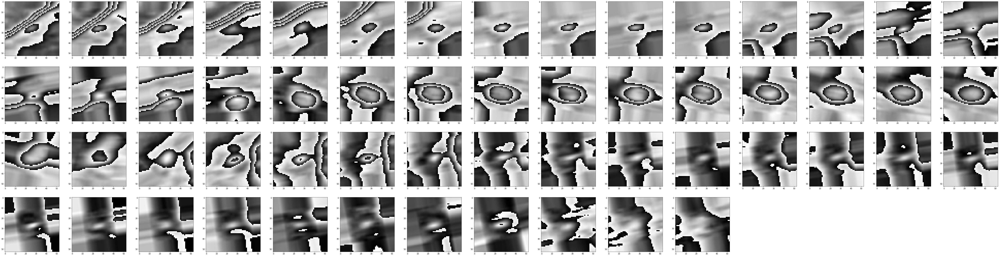

12
shape mean is 53.0
shape max is 53
shape min is 53


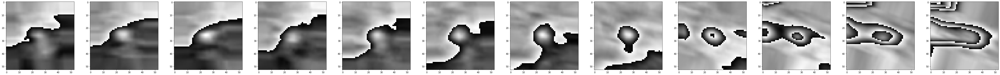

13
shape mean is 53.0
shape max is 53
shape min is 53


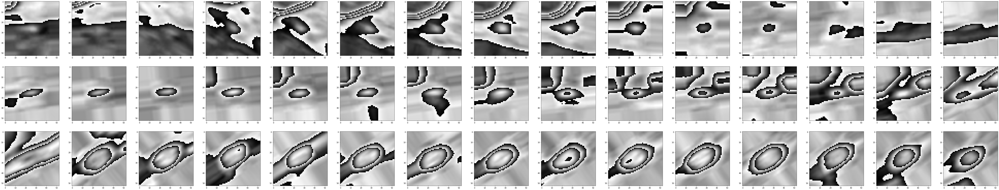

14
shape mean is 53.0
shape max is 53
shape min is 53


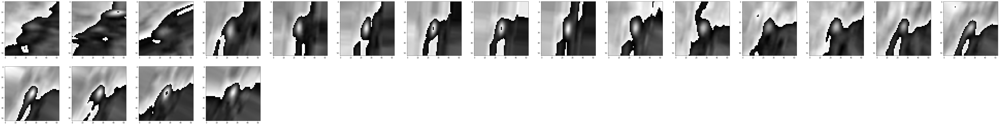

15
shape mean is 53.0
shape max is 53
shape min is 53


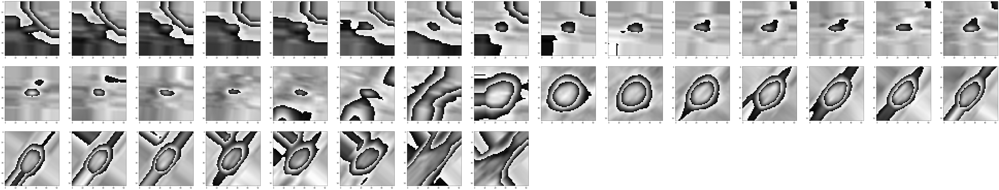

16
shape mean is 53.0
shape max is 53
shape min is 53


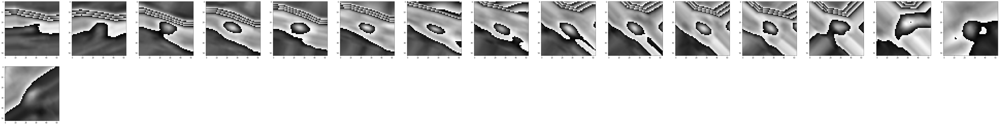

17
shape mean is 53.0
shape max is 53
shape min is 53


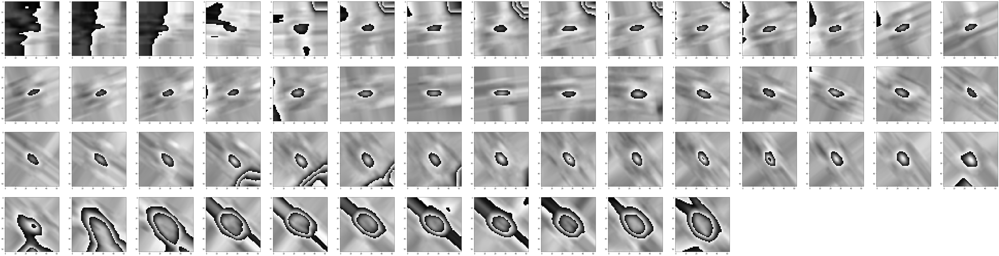

18
shape mean is 53.0
shape max is 53
shape min is 53


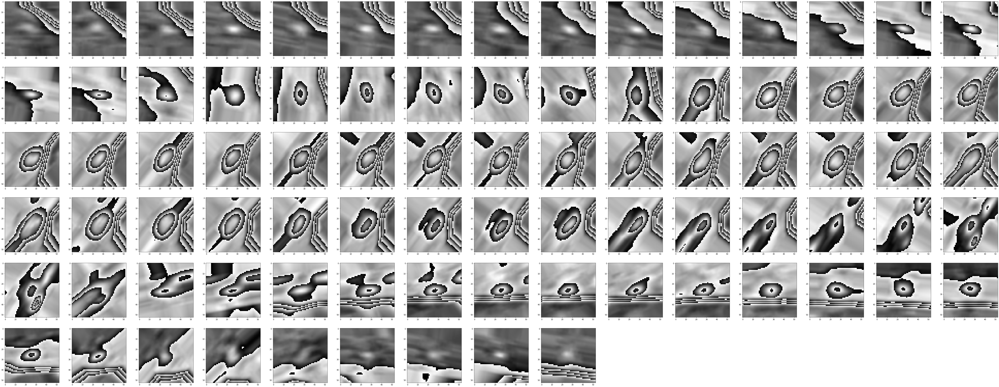

19
shape mean is 53.0
shape max is 53
shape min is 53


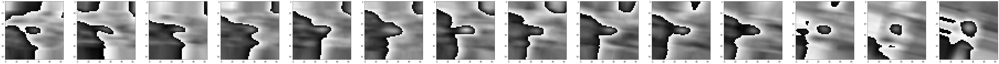

2
shape mean is 53.0
shape max is 53
shape min is 53


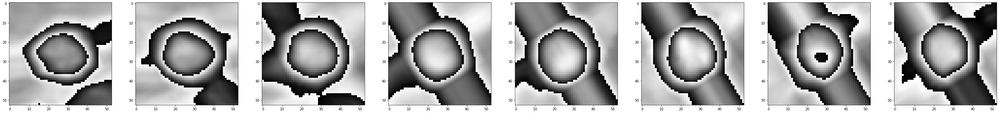

20
shape mean is 53.0
shape max is 53
shape min is 53


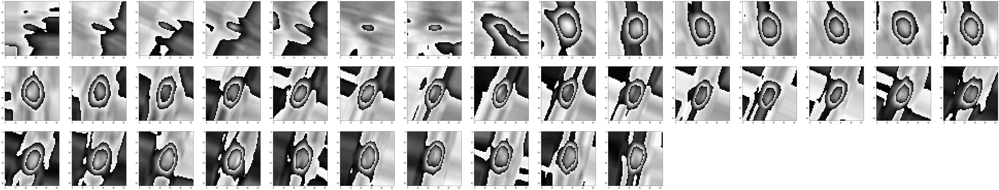

21
shape mean is 53.0
shape max is 53
shape min is 53


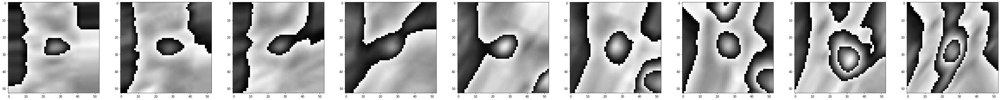

22
shape mean is 53.0
shape max is 53
shape min is 53


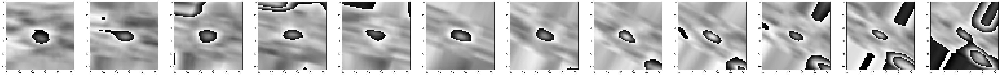

23
shape mean is 53.0
shape max is 53
shape min is 53


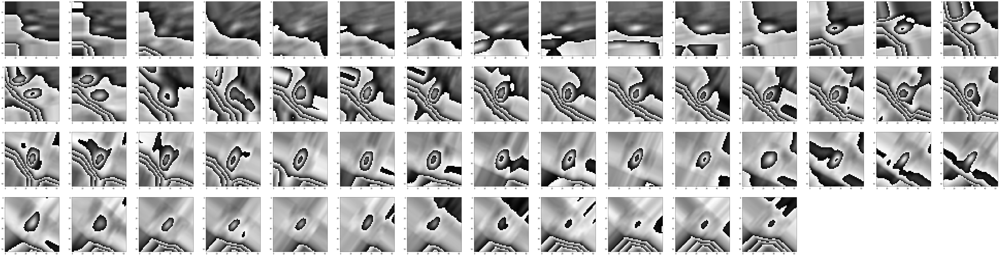

24
shape mean is 53.0
shape max is 53
shape min is 53


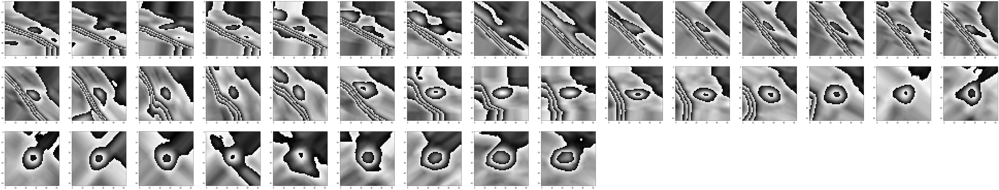

25
shape mean is 53.0
shape max is 53
shape min is 53


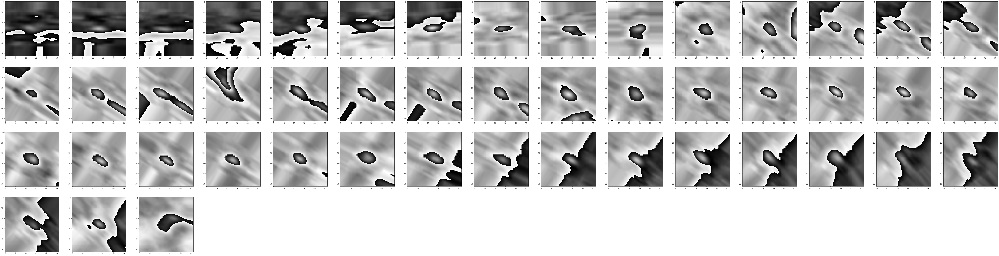

26
shape mean is 53.0
shape max is 53
shape min is 53


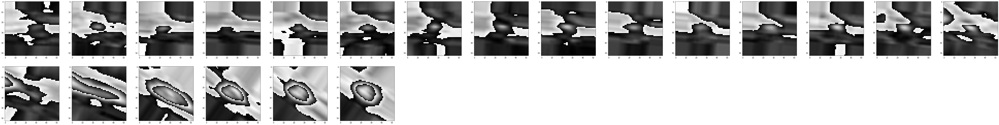

27
shape mean is 53.0
shape max is 53
shape min is 53


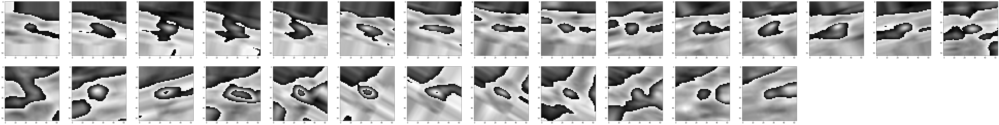

28
shape mean is 53.0
shape max is 53
shape min is 53


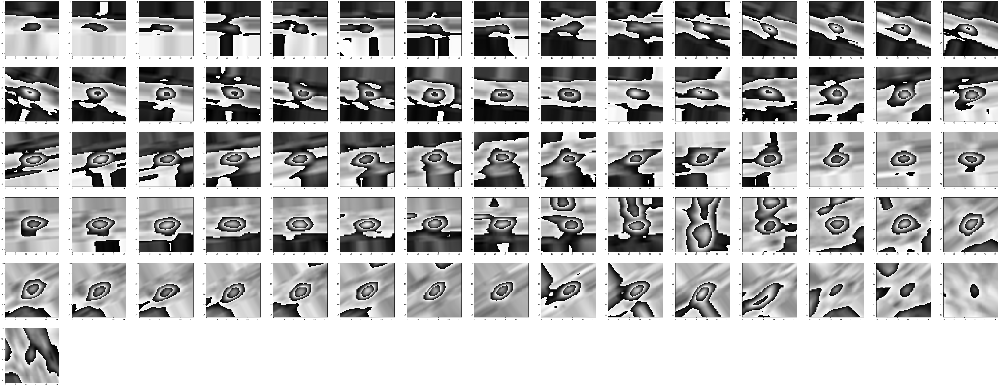

29
shape mean is 53.0
shape max is 53
shape min is 53


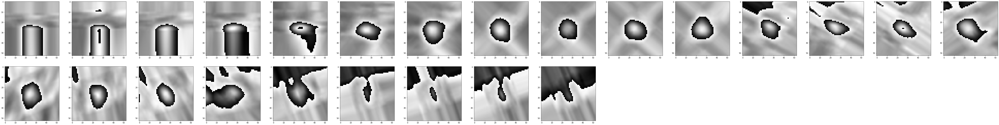

3
shape mean is 53.0
shape max is 53
shape min is 53


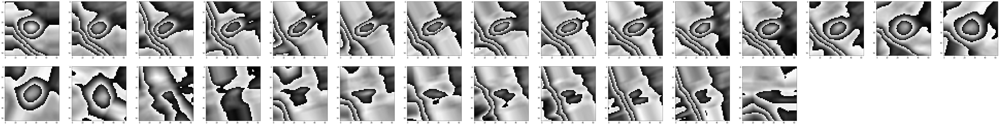

4
shape mean is 53.0
shape max is 53
shape min is 53


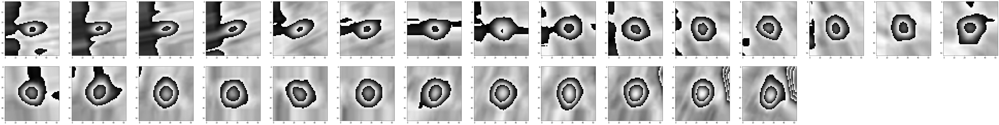

5
shape mean is 53.0
shape max is 53
shape min is 53


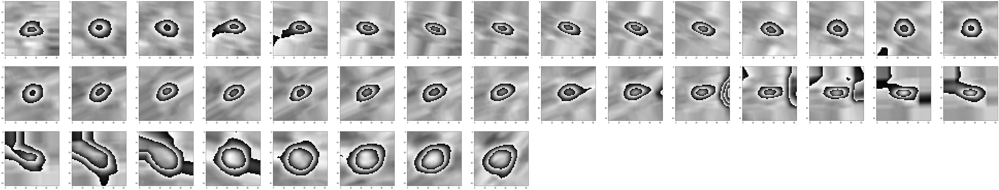

6
shape mean is 53.0
shape max is 53
shape min is 53


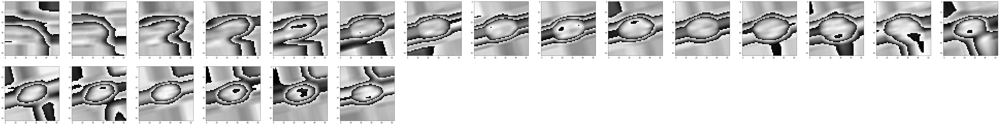

7
shape mean is 53.0
shape max is 53
shape min is 53


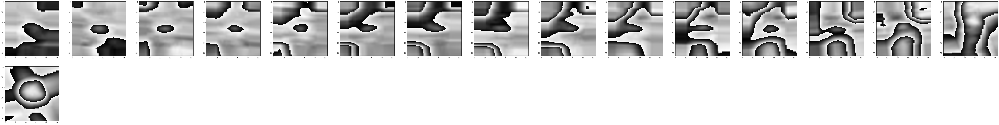

8
shape mean is 53.0
shape max is 53
shape min is 53


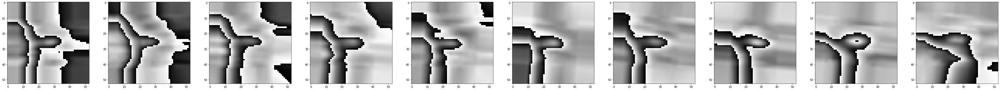

9
shape mean is 53.0
shape max is 53
shape min is 53


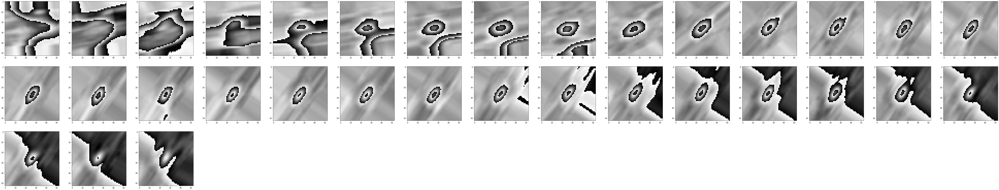

In [15]:
for b in branchs:
    print(b)
    plt.figure(figsize=[100, 100])
    j = 0

    shape_list=[]
    for i in range(len(mat_fp_list)):

        if re.findall('\d+', mat_fp_list[i])[1] == b:

            mat = scio.loadmat(os.path.join(mat_root, mat_fp_list[i]))
            img = mat["RV"]
            img = img.astype(np.uint8)
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
            # print(img.shape)

            shape_list.append(img.shape[0])

            plt.subplot(15, 15, j+1)
            plt.imshow(img)

            j = j+1
    print("shape mean is {}".format(np.mean(shape_list)))
    print("shape max is {}".format(np.max(shape_list)))
    print("shape min is {}".format(np.min(shape_list)))

    # 保存着色图
    image_vis_root = os.path.join(two_d_vis_root, 'image')
    if os.path.exists(image_vis_root) == False:
        os.makedirs(image_vis_root)

    plt.savefig(os.path.join(image_vis_root, 'nii_{}_branch_{}.png'.format(n, b)))
    plt.show()

0
shape mean is 53.0
shape max is 53
shape min is 53


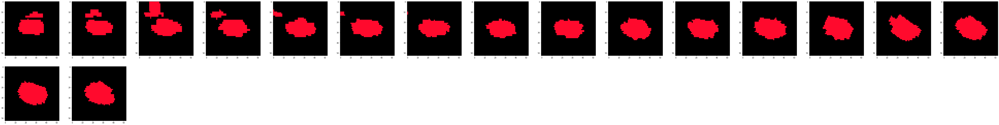

1
shape mean is 53.0
shape max is 53
shape min is 53


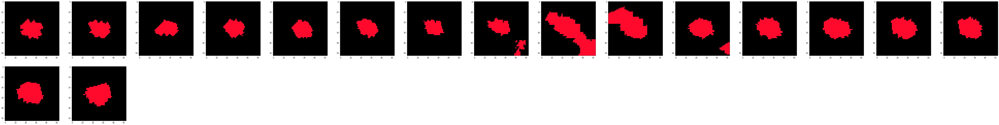

10
shape mean is 53.0
shape max is 53
shape min is 53


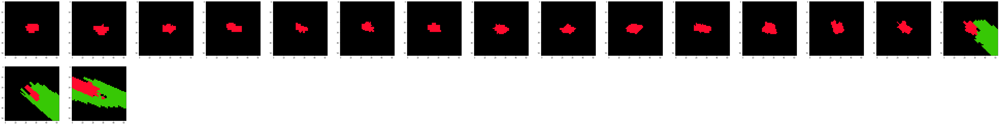

11
shape mean is 53.0
shape max is 53
shape min is 53


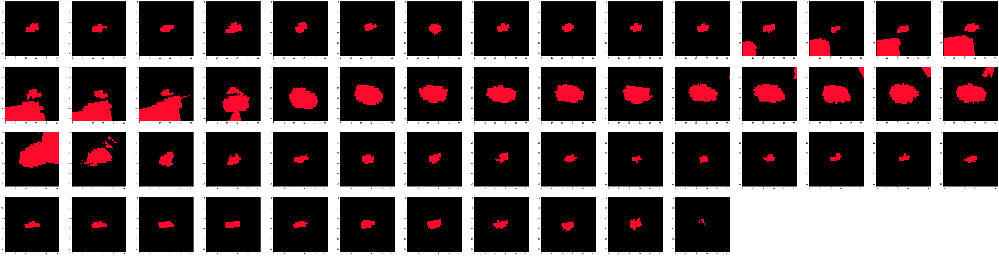

12
shape mean is 53.0
shape max is 53
shape min is 53


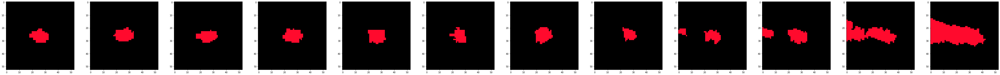

13
shape mean is 53.0
shape max is 53
shape min is 53


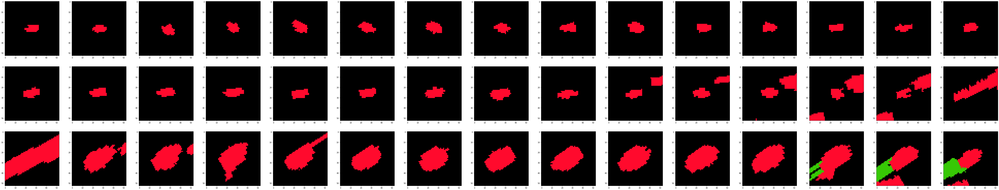

14
shape mean is 53.0
shape max is 53
shape min is 53


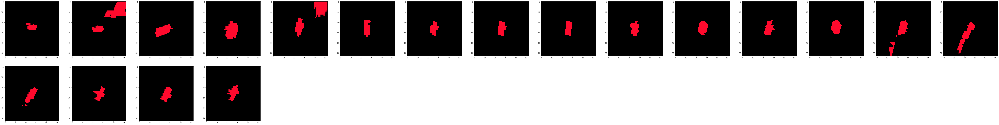

15
shape mean is 53.0
shape max is 53
shape min is 53


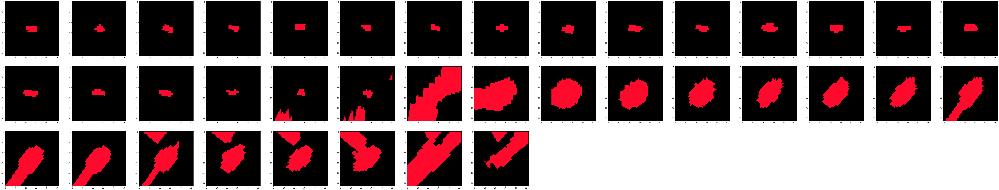

16
shape mean is 53.0
shape max is 53
shape min is 53


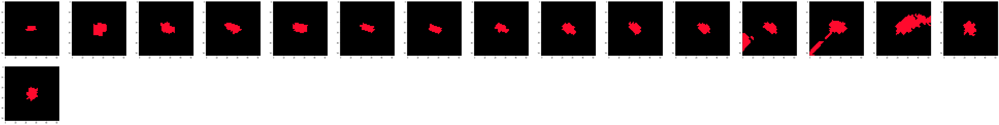

17
shape mean is 53.0
shape max is 53
shape min is 53


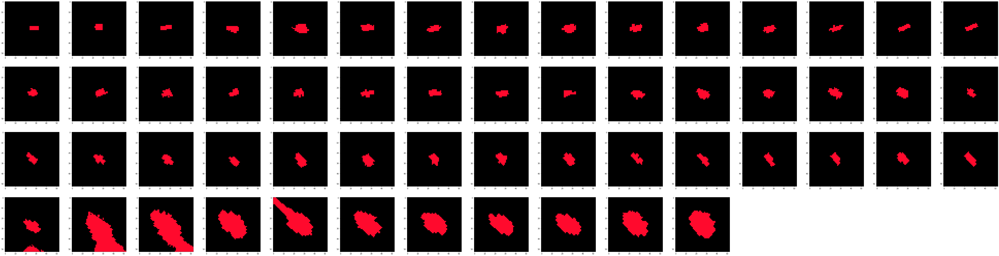

18
shape mean is 53.0
shape max is 53
shape min is 53


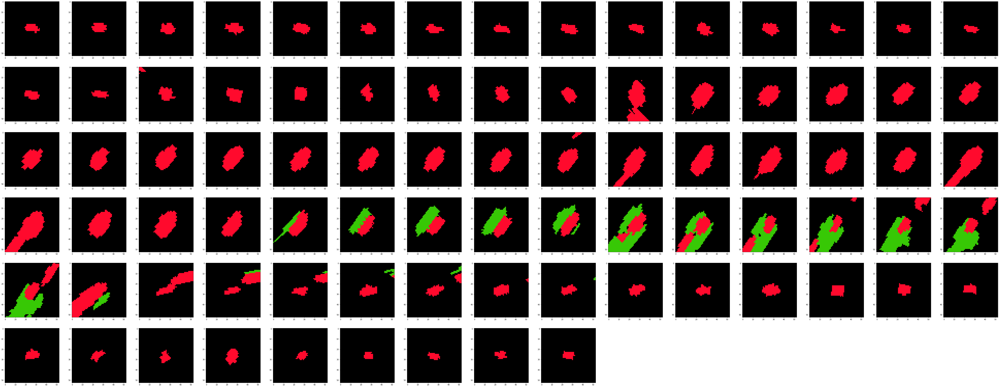

19
shape mean is 53.0
shape max is 53
shape min is 53


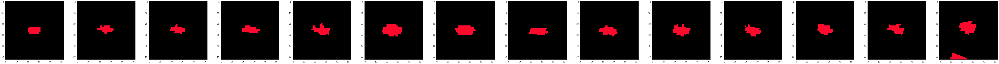

2
shape mean is 53.0
shape max is 53
shape min is 53


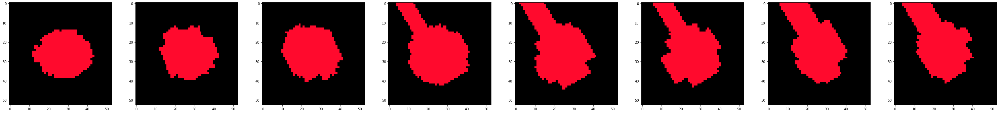

20
shape mean is 53.0
shape max is 53
shape min is 53


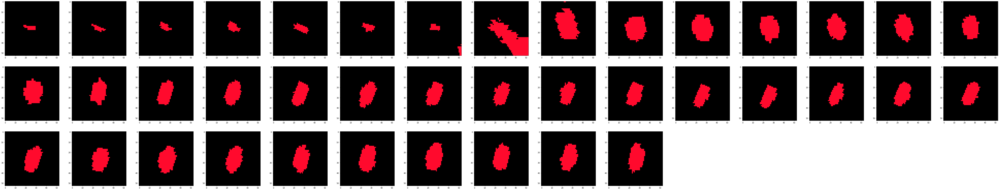

21
shape mean is 53.0
shape max is 53
shape min is 53


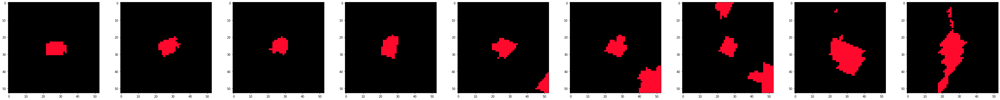

22
shape mean is 53.0
shape max is 53
shape min is 53


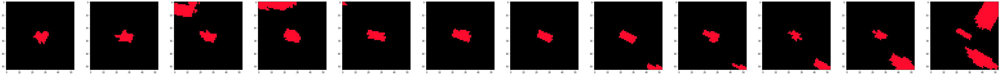

23
shape mean is 53.0
shape max is 53
shape min is 53


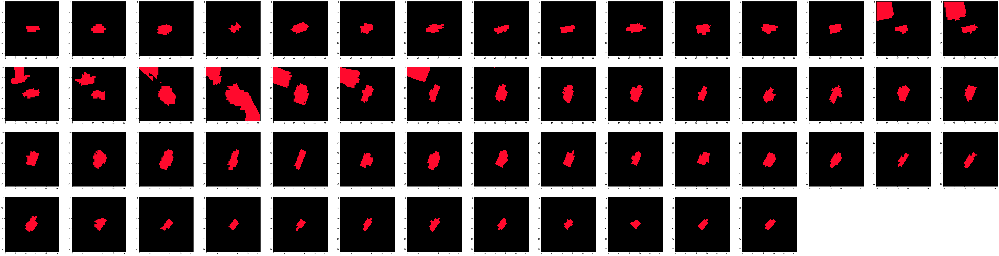

24
shape mean is 53.0
shape max is 53
shape min is 53


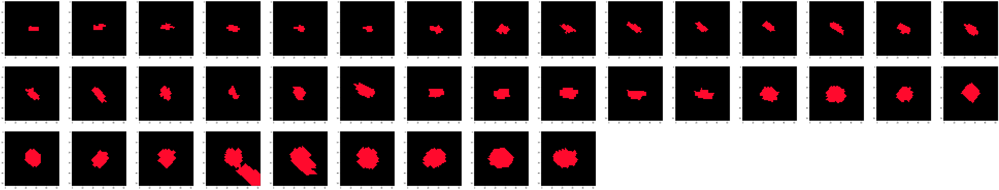

25
shape mean is 53.0
shape max is 53
shape min is 53


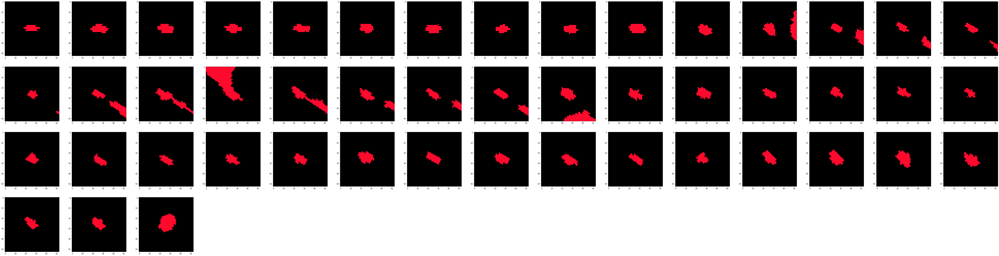

26
shape mean is 53.0
shape max is 53
shape min is 53


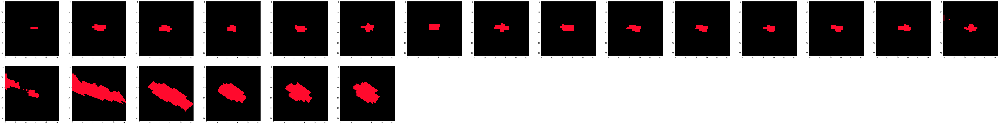

27
shape mean is 53.0
shape max is 53
shape min is 53


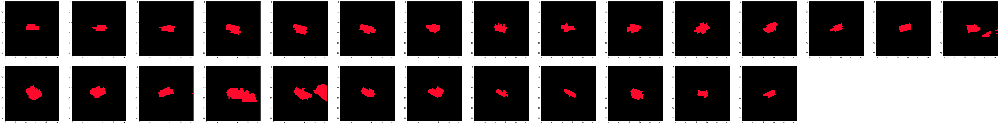

28
shape mean is 53.0
shape max is 53
shape min is 53


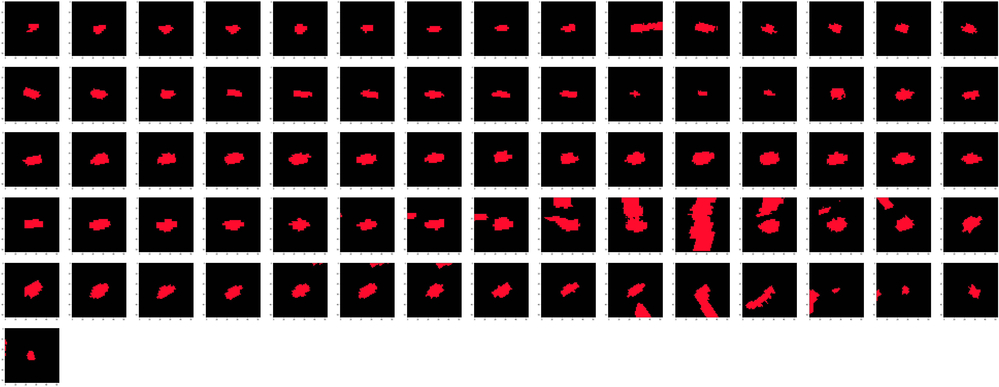

29
shape mean is 53.0
shape max is 53
shape min is 53


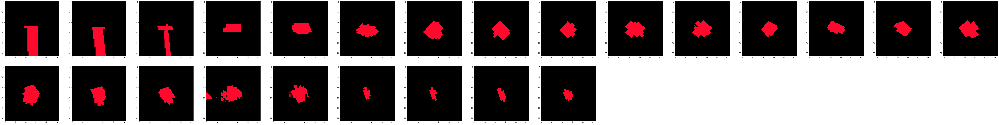

3
shape mean is 53.0
shape max is 53
shape min is 53


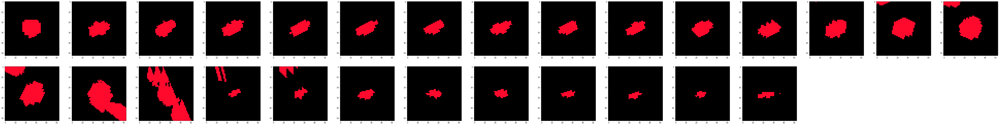

4
shape mean is 53.0
shape max is 53
shape min is 53


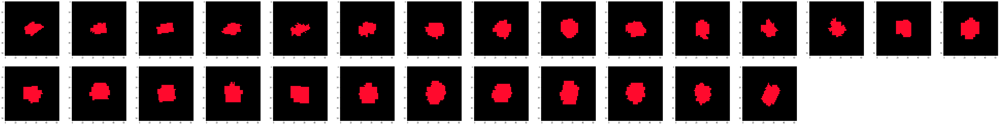

5
shape mean is 53.0
shape max is 53
shape min is 53


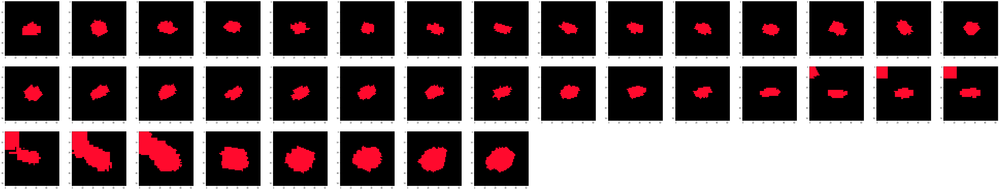

6
shape mean is 53.0
shape max is 53
shape min is 53


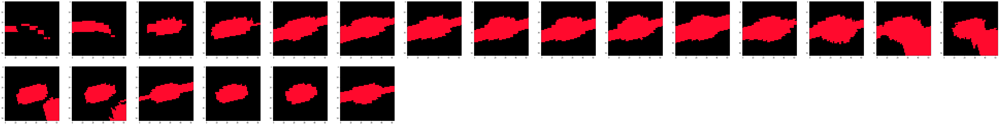

7
shape mean is 53.0
shape max is 53
shape min is 53


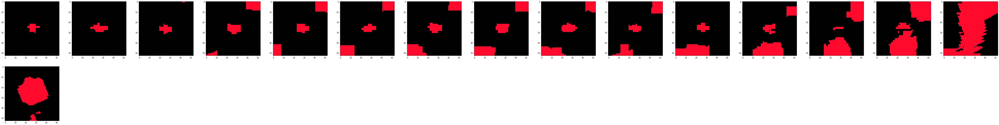

8
shape mean is 53.0
shape max is 53
shape min is 53


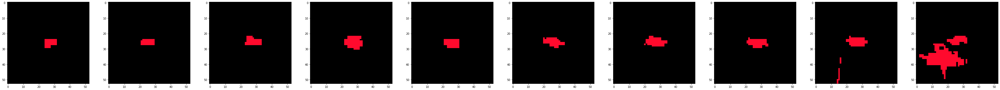

9
shape mean is 53.0
shape max is 53
shape min is 53


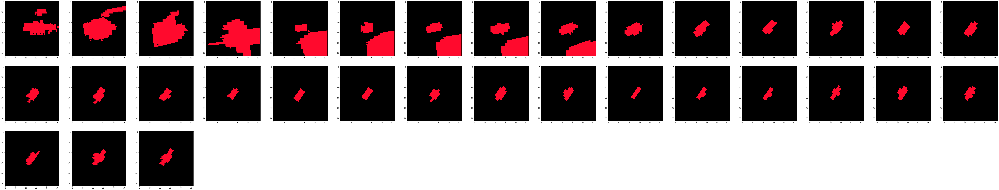

In [16]:
for b in branchs:
    print(b)
    plt.figure(figsize=[100, 100])
    j = 0

    shape_list=[]
    for i in range(len(mat_fp_list)):

        if re.findall('\d+', mat_fp_list[i])[1] == b:

            mask = scio.loadmat(os.path.join(mask_root, mask_fp_list[i]))
            mask = mask["RV_mask"]
            mask =mask.astype(np.uint8)
            mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
            mask_1 = np.where(mask == [1, 1, 1],  [255, 10, 45], 0)
            mask_254 = np.where(mask == [254, 254, 254], [55, 200, 5], 0)
            mask = mask_1 + mask_254
            # print(img.shape)

            shape_list.append(mask.shape[0])

            plt.subplot(15, 15, j+1)
            plt.imshow(mask)

            j = j+1
    print("shape mean is {}".format(np.mean(shape_list)))
    print("shape max is {}".format(np.max(shape_list)))
    print("shape min is {}".format(np.min(shape_list)))

    # 保存着色图
    mask_vis_root = os.path.join(two_d_vis_root, 'mask')
    if os.path.exists(mask_vis_root) == False:
        os.makedirs(mask_vis_root)

    plt.savefig(os.path.join(mask_vis_root, 'nii_{}_branch_{}.png'.format(n, b)))
    plt.show()








